**Author:** Elias Rafael Ruiz-Morales

**Institution:** Wellcome Sanger institute

**July, 2023**

---

# Notebook to perform the clustering analysis of the integrated All data


In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import os
import sys
import anndata
import scvi


In [2]:
def MovePlots(plotpattern, subplotdir):
    os.system('mkdir -p '+str(sc.settings.figdir)+'/'+subplotdir)
    os.system('mv '+str(sc.settings.figdir)+'/*'+plotpattern+'** '+str(sc.settings.figdir)+'/'+subplotdir)

sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.figdir = '../results/images/integrated/'
sc.logging.print_versions()
sc.settings.set_figure_params(dpi=80)  # low dpi (dots per inch) yields small inline figures

sys.executable

-----
anndata     0.7.5
scanpy      1.7.1
sinfo       0.3.1
-----
PIL                 8.1.2
absl                NA
anndata             0.7.5
anyio               NA
attr                20.3.0
babel               2.9.0
backcall            0.2.0
brotli              NA
cairo               1.20.0
certifi             2020.12.05
cffi                1.14.5
chardet             4.0.0
cloudpickle         1.6.0
colorama            0.4.4
cycler              0.10.0
cython_runtime      NA
cytoolz             0.11.0
dask                2021.03.1
dateutil            2.8.1
decorator           4.4.2
fsspec              0.8.7
get_version         2.1
google              NA
h5py                3.1.0
idna                2.10
igraph              0.8.3
ipykernel           5.5.0
ipython_genutils    0.2.0
ipywidgets          7.6.3
jedi                0.18.0
jinja2              2.11.3
joblib              1.0.1
json5               NA
jsonschema          3.2.0
jupyter_server      1.4.1
jupyterlab_server   2.3.0
kiw

'/opt/conda/bin/python'

In [3]:
def doublet_assing(adata_obj, cell_id):
    
    '''
    Function that assigns the "doublet" label to the cells that were pooled
    
    input
        adata_obj: adata object
        cell_id: ID of a sinfle cell

    '''
    
    #is_doublet label of the current cell, it's a boolean value
    curr_isDoublet = adata_obj.obs.loc[cell_id, 'is_doublet']


    #If the is_doublet is True, then the function willl return the "doublet"
    # Otherwise it will return the "singlet". 
    if curr_isDoublet == True:
        return("doublet")
    
    else:
        return("singlet")

    

In [4]:
adata = sc.read('../results/scVI/rna2_scVIintegrated_AllData.h5ad')
adata.X.shape

(119146, 36601)

In [5]:
adata.X=adata.layers['raw_counts'].copy()

### Normalization

In [6]:
#Normalize and scale data to run neirest neighbors and plot gene expression
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
#sc.pp.scale(adata, max_value=10)

normalizing counts per cell
    finished (0:00:01)


### Plotting the different scVI latent spaces in UMAP embedation

In [7]:
#LATENT 20
sc.pp.neighbors(adata, n_neighbors=20, use_rep="X_scVI_n_latent_20")
sc.tl.umap(adata)

#clustering
sc.tl.leiden(adata, key_added="leiden_scvi", resolution=0.3)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:43)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:01:20)
running Leiden clustering
    finished: found 13 clusters and added
    'leiden_scvi', the cluster labels (adata.obs, categorical) (0:00:34)


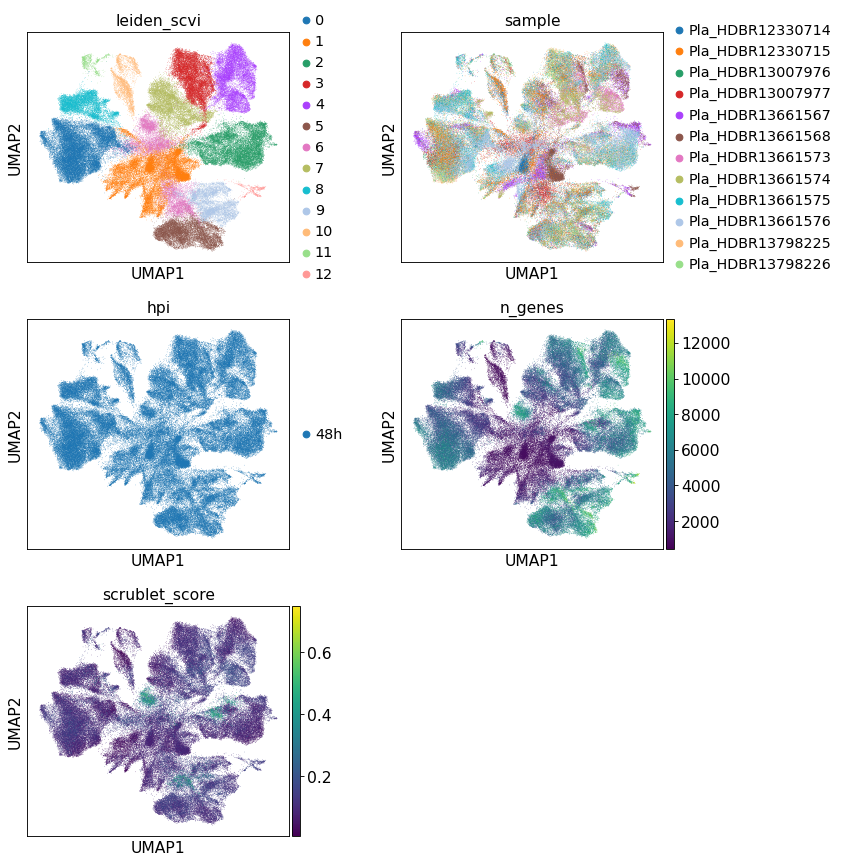

In [8]:
# use scVI imputed values for plotting
sc.pl.umap(adata, color=["leiden_scvi",'sample', 
                         'hpi','n_genes','scrublet_score' ],
           ncols=2, wspace=0.3, save='_scVI_latent20.pdf')

In [9]:
#LATENT 30
sc.pp.neighbors(adata, n_neighbors=20, use_rep="X_scVI_n_latent_30")
sc.tl.umap(adata)

#clustering
sc.tl.leiden(adata, key_added="leiden_scvi", resolution=0.3)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:18)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:01:22)
running Leiden clustering
    finished: found 14 clusters and added
    'leiden_scvi', the cluster labels (adata.obs, categorical) (0:00:35)


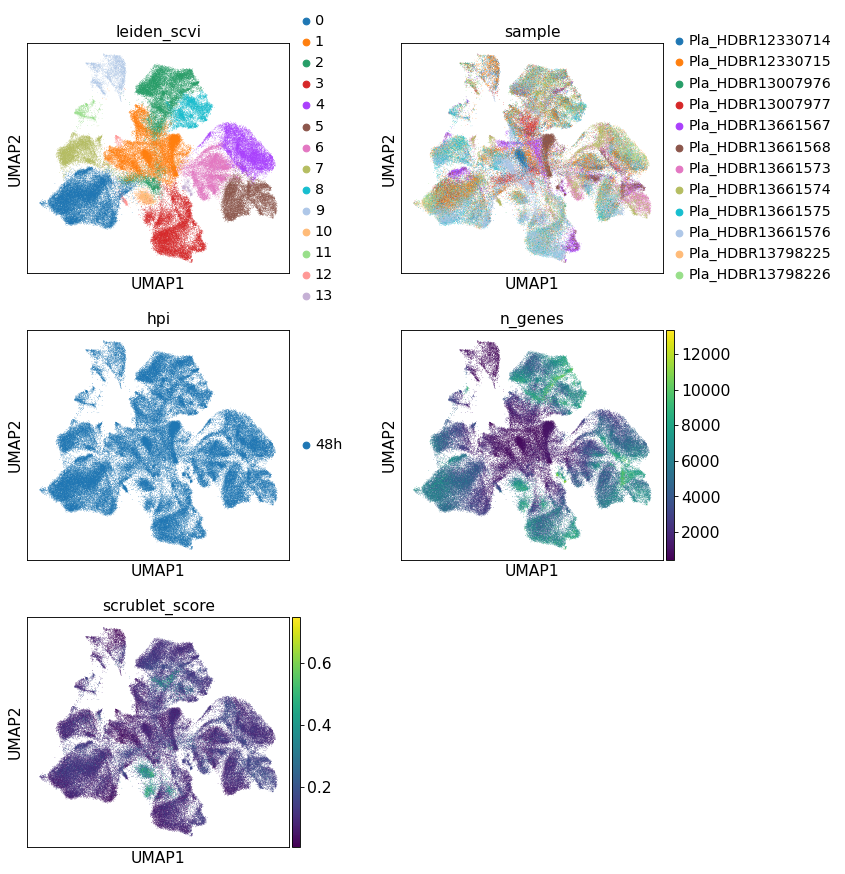

In [10]:
# use scVI imputed values for plotting
sc.pl.umap(adata, color=["leiden_scvi",'sample',#'donor_souporcell', 
                         'hpi','n_genes','scrublet_score']
           ,ncols=2,  wspace=0.3, save='_scVI_latent30.pdf')

### Collapsing cell identities in the different samples

In [11]:
set(adata.obs['donor_id'])

{'Hrv136',
 'Hrv232',
 'Hrv236',
 'donor_doublets',
 'scDonor_Tg1',
 'scDonor_Tg2',
 'scDonor_Tg3',
 'scDonor_Tg4'}

In [12]:
adata

AnnData object with n_obs × n_vars = 119146 × 36601
    obs: 'sample', 'stage', 'donor', 'hpi', 'infection', 'percent_mito', 'n_counts', 'batch', 'sample_barcode', 'assignment_SoC', 'donor_id', 'scrublet_score', 'scrublet_cluster_score', 'zscore', 'bh_pval', 'bonf_pval', 'is_doublet', 'infection_stage', 'S_score', 'G2M_score', 'phase', 'n_genes_by_counts', 'total_counts', 'total_counts_hs', 'pct_counts_hs', 'total_counts_tg', 'pct_counts_tg', 'Tg_infected', 'n_genes', '_scvi_batch', '_scvi_labels', '_scvi_local_l_mean', '_scvi_local_l_var', 'leiden_scvi'
    var: 'gene_ids', 'feature_types', 'mean-0', 'std-0', 'mean-1', 'std-1', 'mean-2', 'std-2', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm'
    uns: '_scvi', 'donor_id_colors', 'hvg', 'infection_colors', 'sample_colors', 'log1p', 'neighbors', 'umap', 'leiden', 'leiden_scvi_colors', 'hpi_colors'
    obsm: 'X_scVI_n_latent_20', 'X_scVI_n_latent_30', '_scvi_extra_categoricals', 'X_umap'
    layers: 'ra

In [13]:
## Function to collapse different columns into the same one

#temp= adata.obs[['identity','identity_v2','identity_v3']]
#identity_collapsed= temp.ffill(1).iloc[:,-1].to_frame(name='identity_collapsed')
#adata.obs['identity_collapsed']=identity_collapsed

### Choosing a number of latent variants for the downstream analysis

In [14]:
sc.pp.neighbors(adata, n_neighbors=20, use_rep="X_scVI_n_latent_20")
sc.tl.umap(adata)
sc.tl.leiden(adata, key_added="leiden_scvi", resolution=0.3)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:19)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:01:25)
running Leiden clustering
    finished: found 13 clusters and added
    'leiden_scvi', the cluster labels (adata.obs, categorical) (0:00:32)


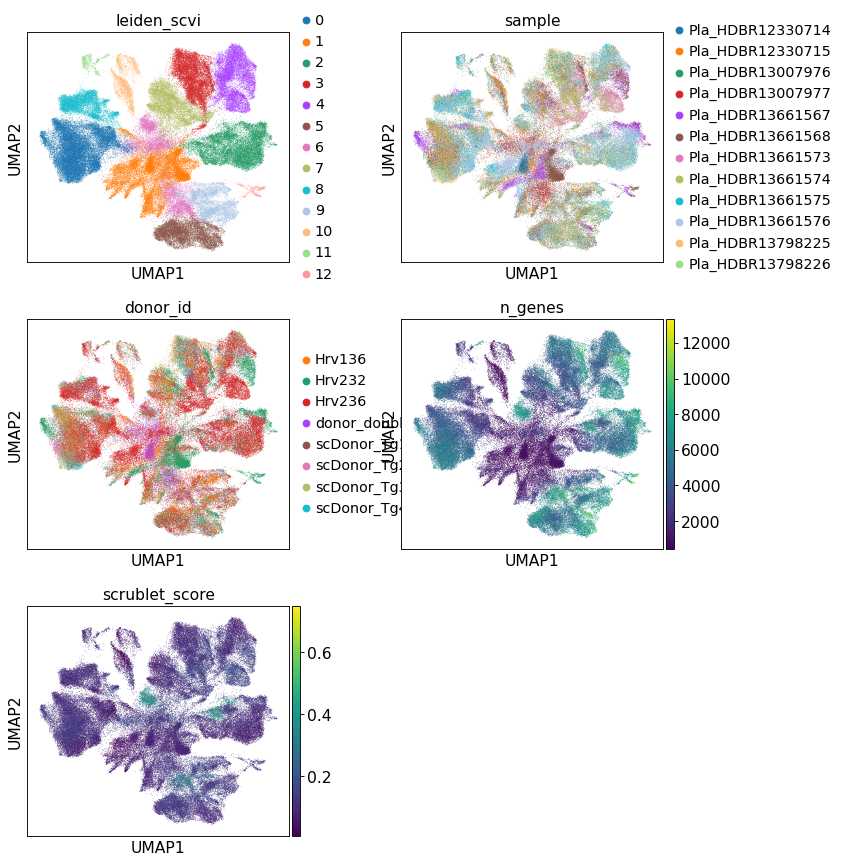

In [15]:
# use scVI imputed values for plotting
sc.pl.umap(adata, color=["leiden_scvi",'sample',#'donor_souporcell', 
                         'donor_id','n_genes' ,'scrublet_score']
           ,ncols=2,  wspace=0.3, save='_scVI_latent30.pdf')

In [16]:
sc.set_figure_params(figsize=(4,4))

### Saving the object with use_rep="X_scVI_n_latent_20"

In [17]:
adata.X=adata.layers['raw_counts'].copy()

In [18]:
adata.write('../results/scVI/rna3_scVIintegrated_All_latent20.h5ad')

In [19]:
#adata= sc.read('../results/scVI/S2_scVIintegrated_adata_latent30.h5ad')

In [20]:
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
#sc.pp.scale(adata, max_value=10)

normalizing counts per cell
    finished (0:00:02)


### Marker genes: plots

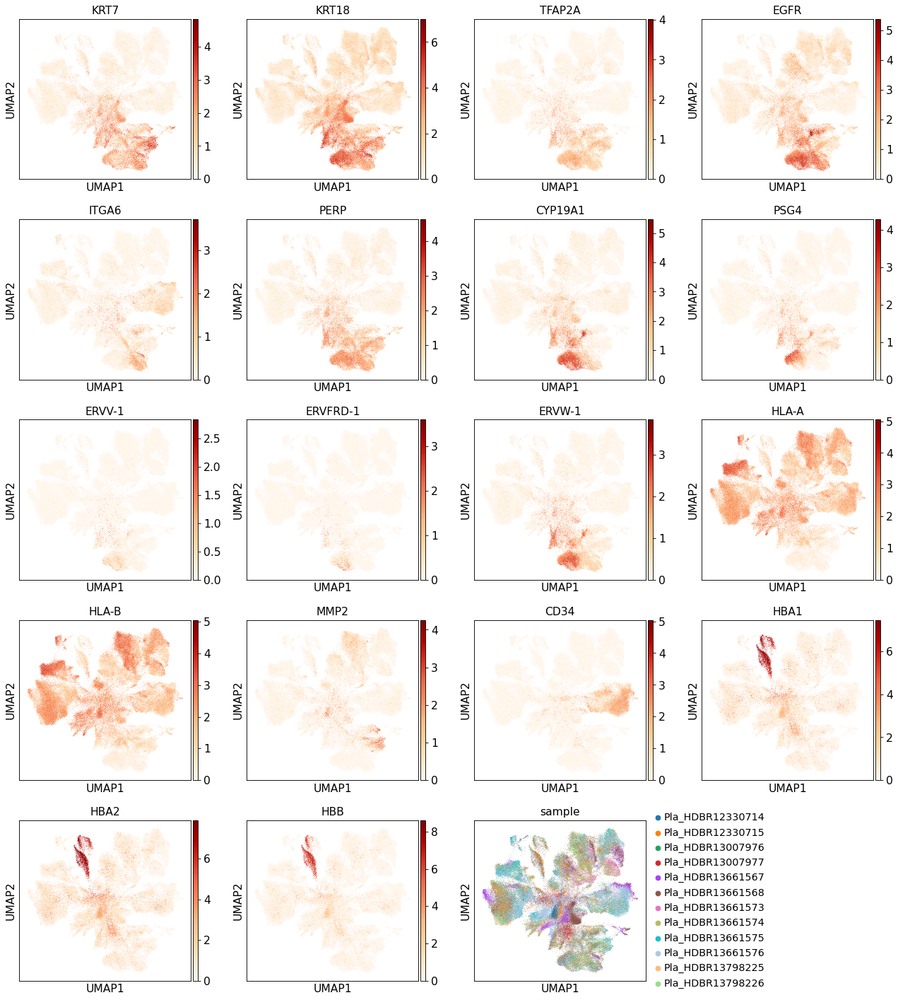

In [21]:
sc.pl.umap(adata, color=['KRT7','KRT18', 'TFAP2A', 'EGFR' ,'ITGA6','PERP', #Trophoblast
                         'CYP19A1','PSG4', #SCT
                         'ERVV-1', #VCT
                         'ERVFRD-1', 'ERVW-1', #SCT & VCT
                         'HLA-A','HLA-B', # NO trophoblast
                         'MMP2', #dS
                         'CD34', #Endo
                         'HBA1','HBA2','HBB', #Ery
                         'sample'], use_raw=False, color_map='OrRd', save='_otherMarkers_scVI_latent20.pdf')

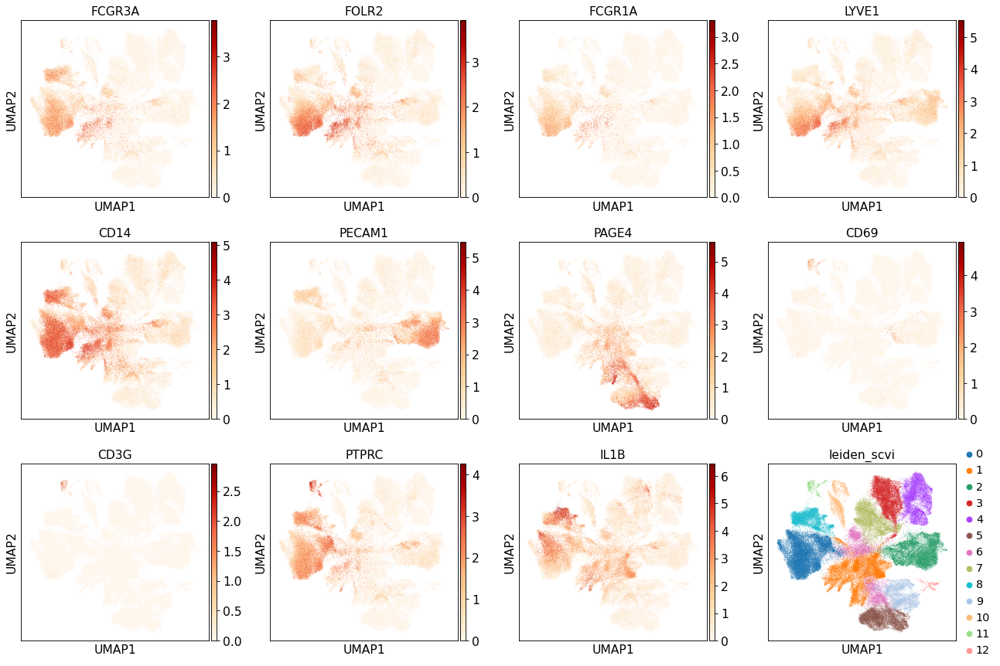

In [22]:
sc.pl.umap(adata, color=['FCGR3A', 'FOLR2', 'FCGR1A', 'LYVE1', 'CD14','PECAM1','PAGE4',
                         'CD69', 'CD3G','PTPRC','IL1B','leiden_scvi'],color_map='OrRd',use_raw=False,
           save='_placentaImmuneMarkers_scVI_latent20.pdf')

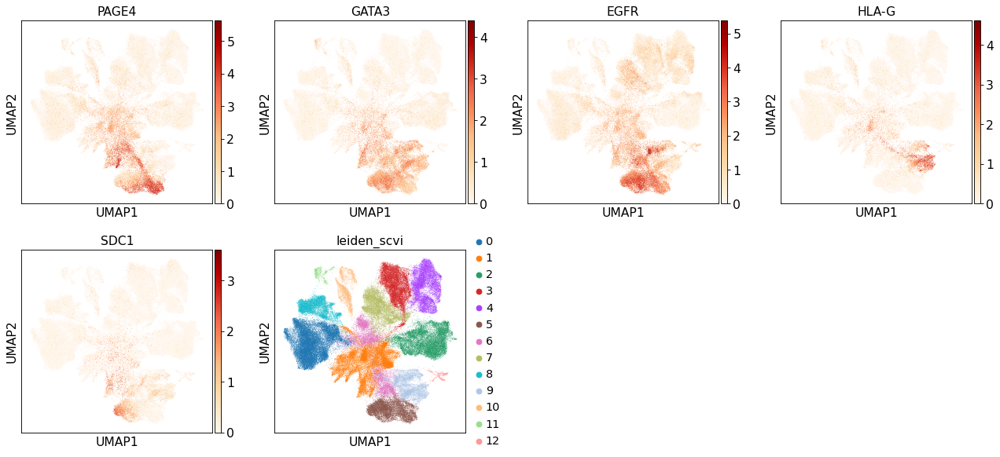

In [23]:
sc.pl.umap(adata, color=['PAGE4', 'GATA3', 'EGFR', 'HLA-G','SDC1','leiden_scvi']
           ,use_raw=False, color_map='OrRd', save='_trophoblastMarkers_scVI_latent20.pdf')

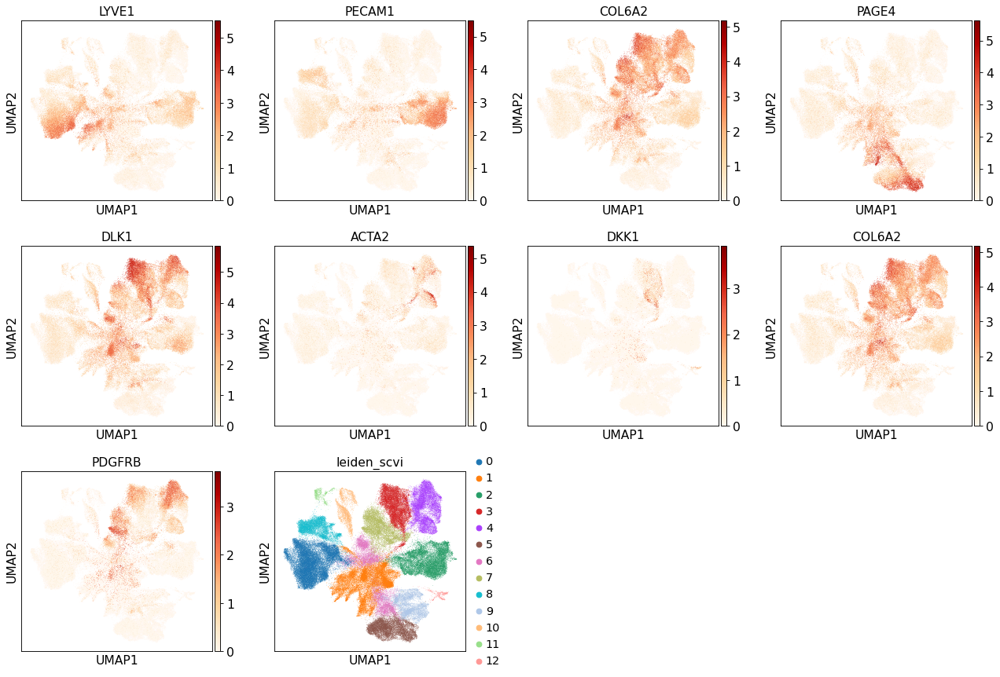

In [24]:
sc.pl.umap(adata, color=['LYVE1', 'PECAM1', 'COL6A2', 'PAGE4',
                        'DLK1', 'ACTA2','DKK1', 'COL6A2','PDGFRB', 'leiden_scvi'],color_map='OrRd',use_raw=False,
           save='_placentaMarkers_scVI_latent20.pdf')

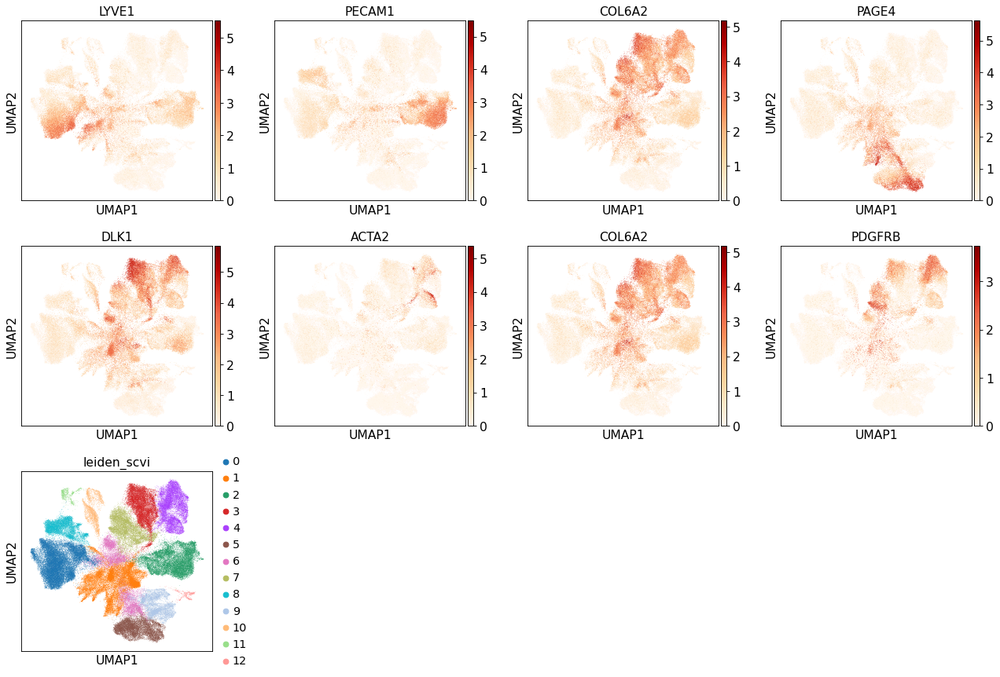

In [25]:
sc.pl.umap(adata, color=['LYVE1', 'PECAM1', 'COL6A2', 'PAGE4',
                        'DLK1', 'ACTA2', 'COL6A2','PDGFRB', 'leiden_scvi'],use_raw=False, color_map='OrRd')

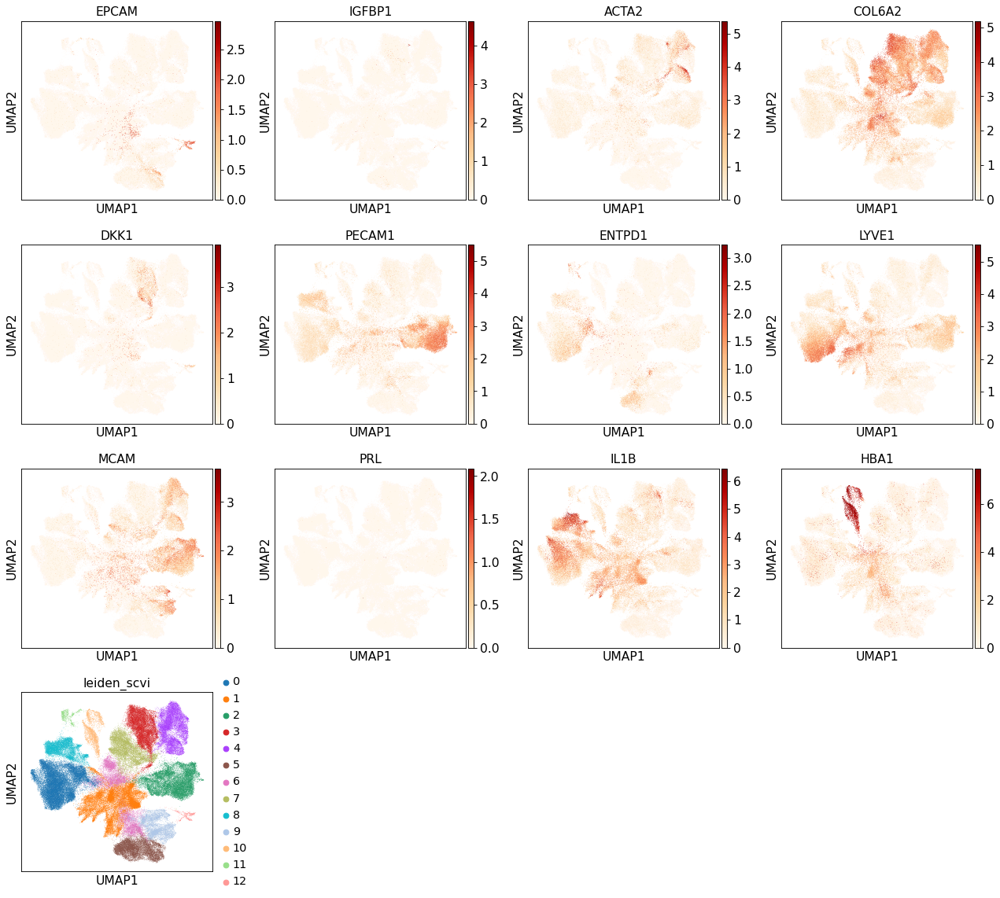

In [26]:
sc.pl.umap(adata, color=['EPCAM', 'IGFBP1', 'ACTA2', 'COL6A2', 'DKK1','PECAM1','ENTPD1', 'LYVE1', 'MCAM',
                         'PRL','IL1B','HBA1',
                         'leiden_scvi'],color_map='OrRd',use_raw=False, save='_deciduaMarkers_scVI_latent20.pdf')

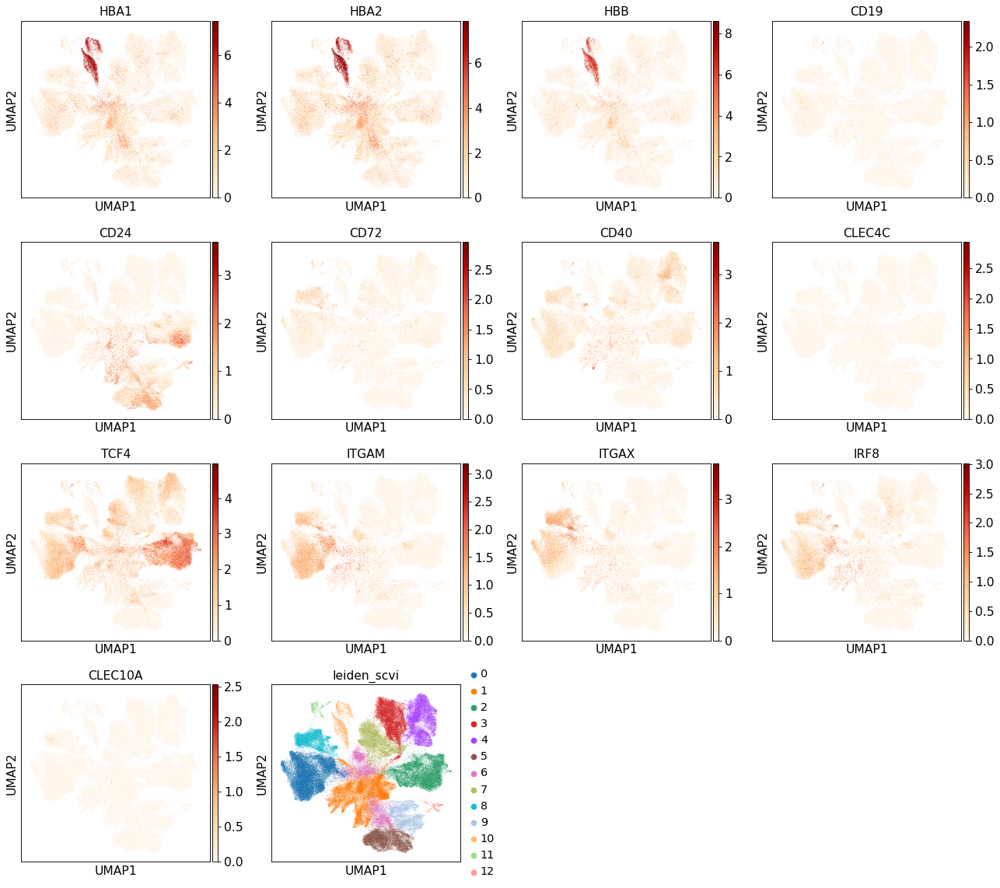

In [27]:
sc.pl.umap(adata, color=['HBA1','HBA2','HBB', #Erythrocyte
                         'CD19','CD24', 'CD72', #B cells
                         'CD40',#macrophage
                         'CLEC4C','TCF4','ITGAM','ITGAX','IRF8','CLEC10A', #DCs
                         'leiden_scvi'],use_raw=False, color_map='OrRd')

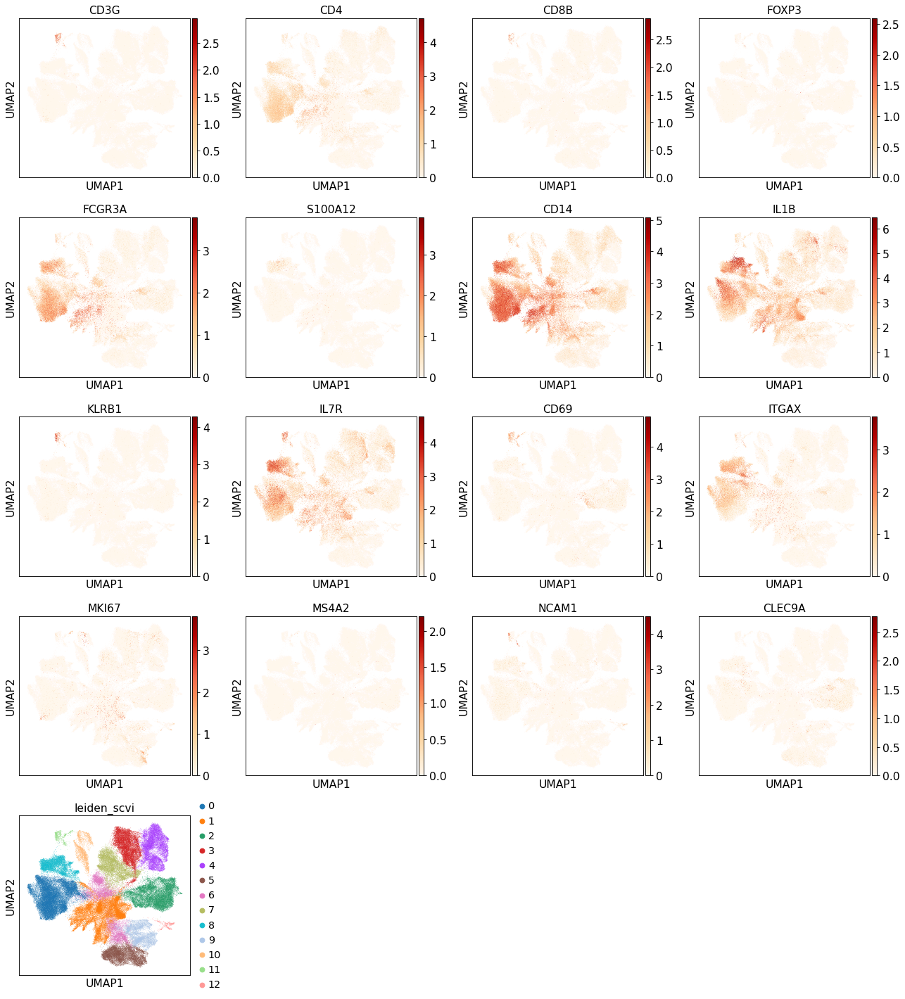

In [28]:
sc.pl.umap(adata, color=[ 'CD3G', 'CD4', 'CD8B', 'FOXP3', 'FCGR3A','S100A12','CD14','IL1B',
                         'KLRB1','IL7R','CD69','ITGAX','MKI67','MS4A2','NCAM1', 'CLEC9A',
                         'leiden_scvi'],color_map='OrRd',use_raw=False, save='_deciduaImmuneMarkers_scVI_latent20.pdf')

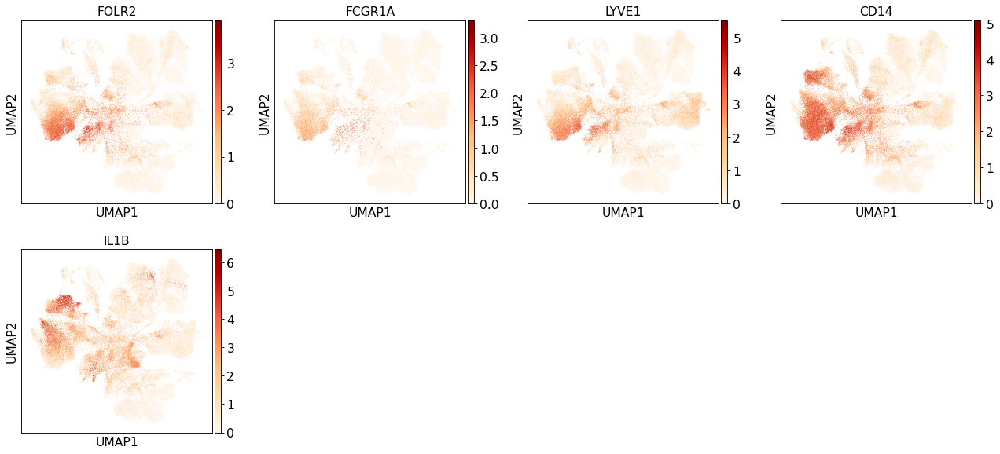

In [29]:
sc.pl.umap(adata, color=['FOLR2', 'FCGR1A', 'LYVE1', 'CD14','IL1B'],color_map='OrRd',use_raw=False,
           save='_HBMarkers_scVI_latent20.pdf')

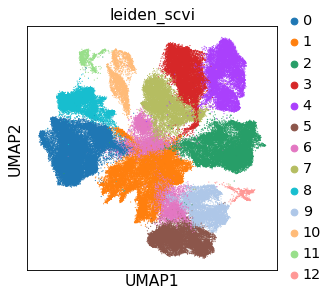

In [30]:

# use scVI imputed values for plotting
sc.pl.umap(adata, color=['leiden_scvi' ], size=4, save='_scVI_latent20_clusters.pdf')

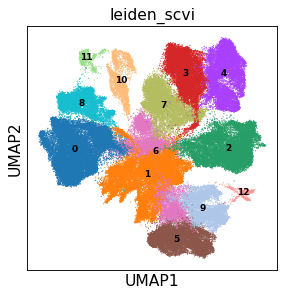

In [31]:

# use scVI imputed values for plotting
sc.pl.umap(adata, color=['leiden_scvi' ], legend_loc='on data',legend_fontsize='xx-small',
           size=4, save='_scVI_latent30_clustersOnData.pdf')

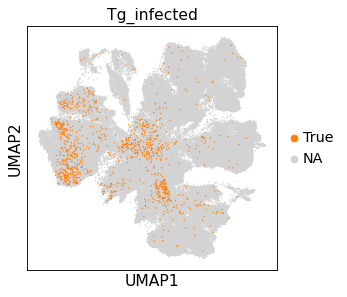

In [32]:
sc.pl.umap(adata, color=['Tg_infected'], groups='True',size=6, save='_scVI_latent20_TgInfectedCells.pdf') 